### TPº1 VISIÓN POR COMPUTADORA.

Integrantes: 
- Fernando Vasconcelos
- Lara Rosenberg
- Victoria Terán

In [1]:
# Importamos las librerias necesarias
%matplotlib inline  
import numpy as np 
import cv2 as cv
import matplotlib.pyplot as plt
import ipywidgets as widgets

### PARTE 1

#### Algoritmo de pasaje a coordenadas cromáticas: 
Implementamos dos funciones, la primera es un paso a paso y en la segunda aprovechamos las bondades de numpy para optimizar el tiempo de procesamiento.

* Función paso a paso:

In [2]:
def coordenadas_cromaticas(image_path):  
    # Cargamos la imagen  
    image = cv.imread(image_path)  
    
    # Convertimos de BGR a RGB  
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)  
    
    # Obtenemos las dimensiones de la imagen  
    alto, ancho, _ = image_rgb.shape  
    
    # Inicializamos la imagen corregida  
    image_chromatic = np.zeros_like(image_rgb)  
    
    # Calculamos las coordenadas cromáticas y corregimos la imagen  
    for y in range(alto):  
        for x in range(ancho):  
            r, g, b = image_rgb[y, x]  
            suma_rgb =int(r)+int(g)+int(b)
            if suma_rgb > 0:  
                r_descriptor = r / suma_rgb  
                g_descriptor = g / suma_rgb  
                b_descriptor = b / suma_rgb  
                
                image_chromatic[y, x] = [np.uint8(r_descriptor*255), np.uint8(g_descriptor*255), np.uint8(b_descriptor*255)]
    

    # Visualizamos las imágenes  
    plt.figure(figsize=(12, 6))  
    plt.subplot(1, 2, 1)  
    plt.title('Imagen Original')  
    plt.imshow(image_rgb)  
    plt.axis('off')  

    plt.subplot(1, 2, 2)  
    plt.title('Imagen Correccion Cromatica')  
    plt.imshow(image_chromatic)  
    plt.axis('off')  

    plt.show()

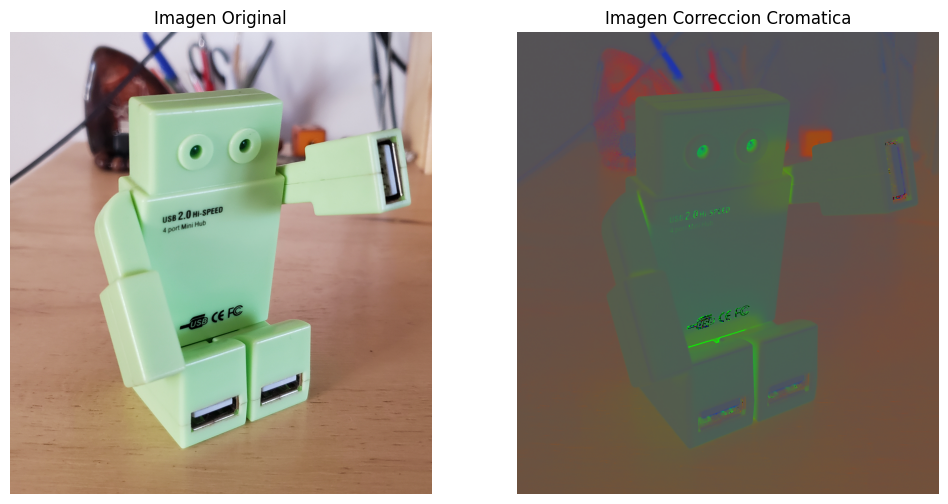

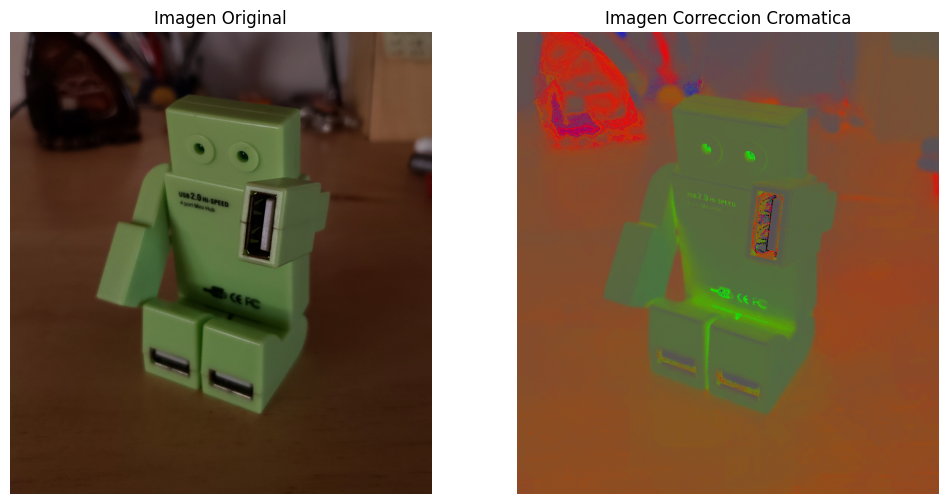

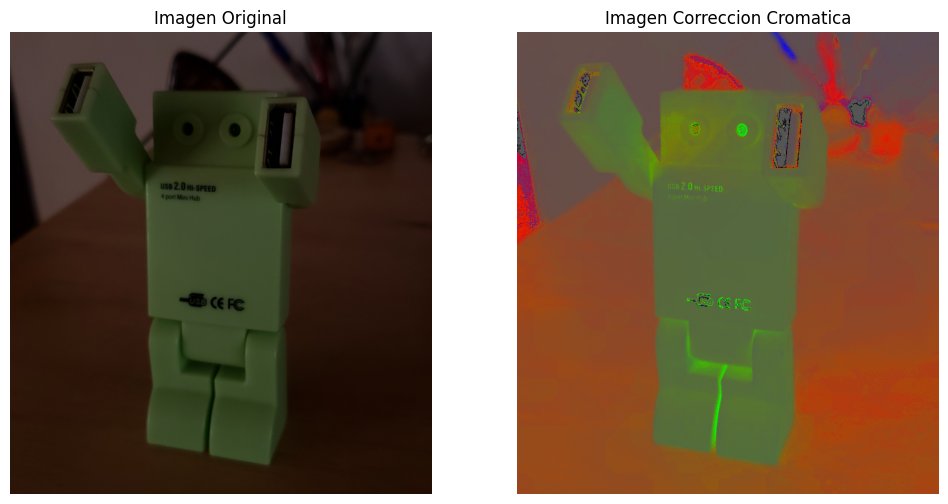

In [3]:
coordenadas_cromaticas('coord_cromaticas/CoordCrom_1.png')  
coordenadas_cromaticas('coord_cromaticas/CoordCrom_2.png')  
coordenadas_cromaticas('coord_cromaticas/CoordCrom_3.png')  

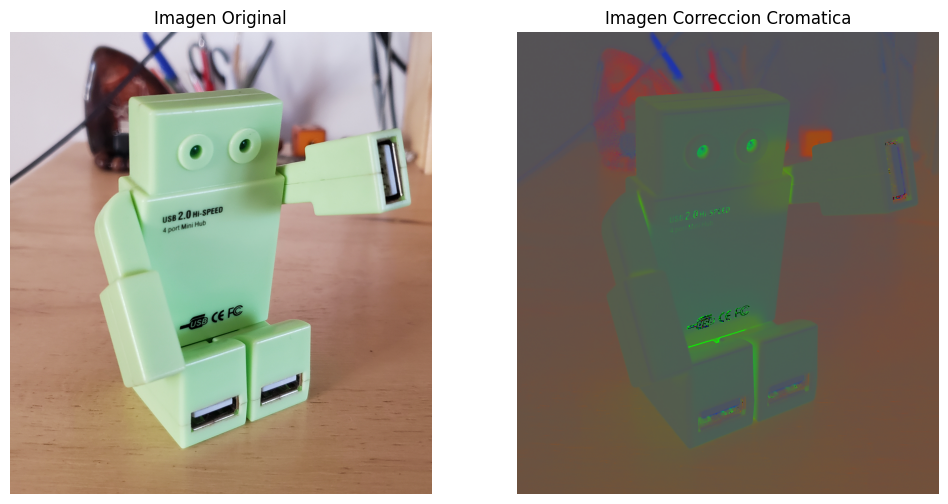

CPU times: user 4.39 s, sys: 171 ms, total: 4.57 s
Wall time: 6.19 s


In [4]:
%%time
coordenadas_cromaticas('coord_cromaticas/CoordCrom_1.png')  

La primera función tarda: 4.39 s

* Función optimizada:

In [5]:
def coordenadas_cromaticas_faster(image_path):
    # Cargamos la imagen  
    image = cv.imread(image_path)  
    
    # Convertimos de BGR a RGB  
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)  

    rgb_divider = np.sum(image_rgb, axis=2)
    print(type(rgb_divider))

    rgb_divider = rgb_divider[:,:,np.newaxis]
    image_chromatic = np.divide(image_rgb, rgb_divider, where=rgb_divider != 0)

    # Visualizamos las imágenes  
    plt.figure(figsize=(12, 6))  
    plt.subplot(1, 2, 1)  
    plt.title('Imagen Original')  
    plt.imshow(image_rgb)  
    plt.axis('off')  

    plt.subplot(1, 2, 2)  
    plt.title('Imagen Correccion Cromatica')  
    plt.imshow(image_chromatic)  
    plt.axis('off')  

    plt.show()

<class 'numpy.ndarray'>


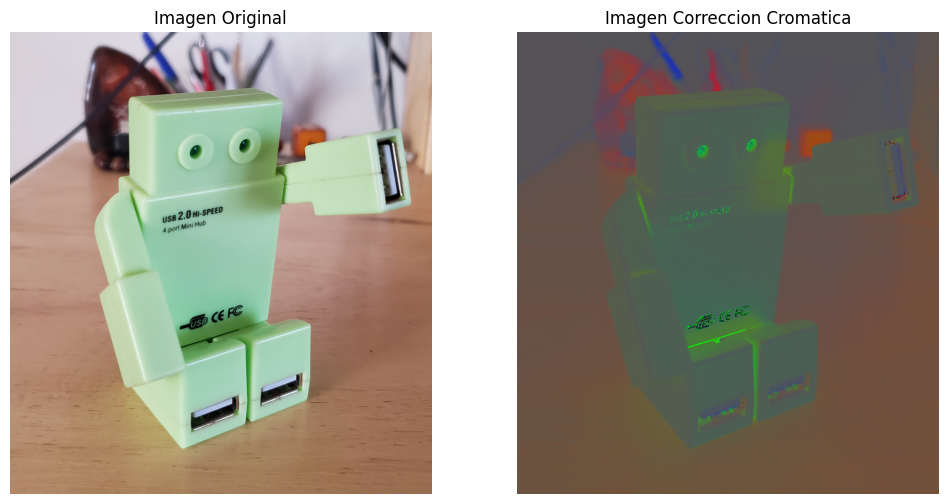

<class 'numpy.ndarray'>


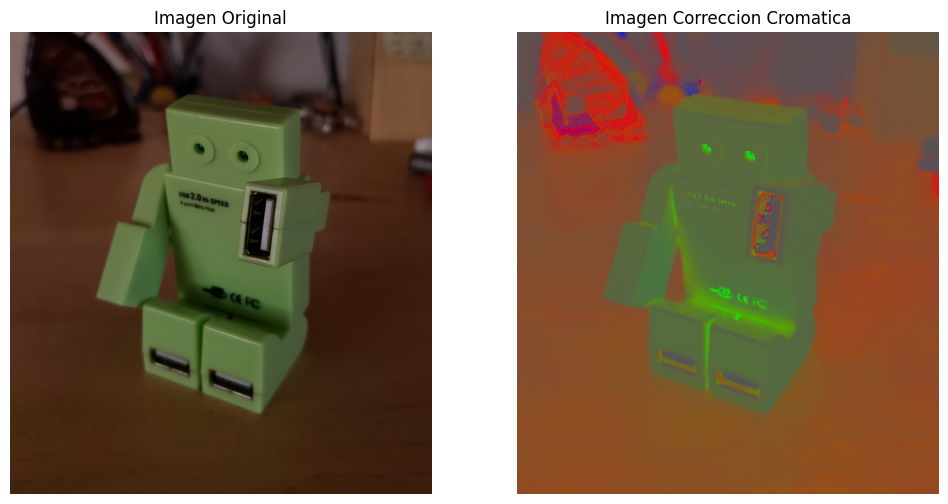

<class 'numpy.ndarray'>


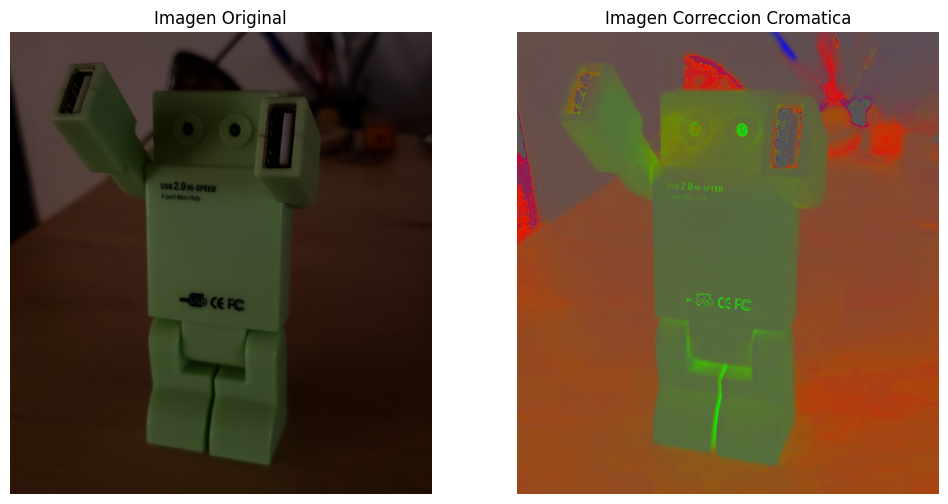

In [6]:
coordenadas_cromaticas_faster('coord_cromaticas/CoordCrom_1.png')  
coordenadas_cromaticas_faster('coord_cromaticas/CoordCrom_2.png')  
coordenadas_cromaticas_faster('coord_cromaticas/CoordCrom_3.png')  

<class 'numpy.ndarray'>


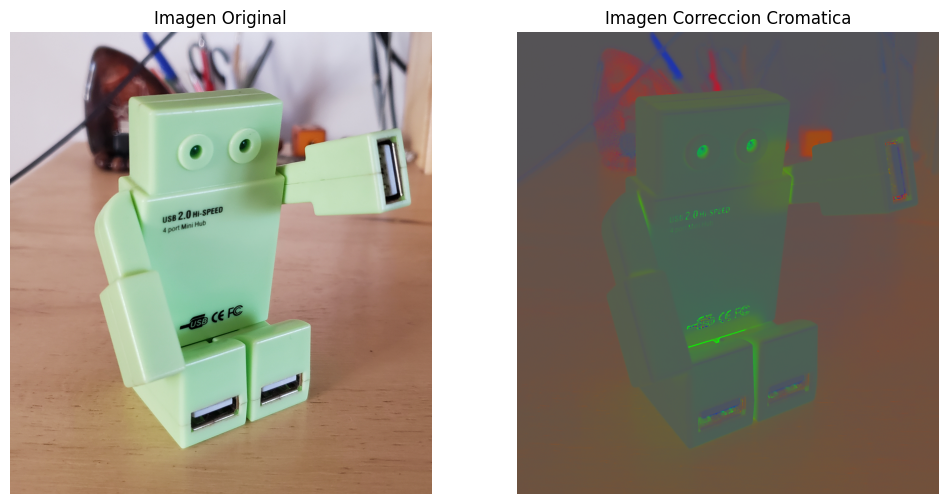

CPU times: user 620 ms, sys: 65.5 ms, total: 686 ms
Wall time: 915 ms


In [7]:
%%time
coordenadas_cromaticas_faster('coord_cromaticas/CoordCrom_1.png')  

La segunda función tarda: 620 ms. Vemos que se reduce sustancialmente el tiempo de cálculo y esto es útil a la hora de entrenar un modelo donde sea necesario preprocesar varias las imagenes.

#### Algoritmo de White Patch: 
Implementamos tres funciones:
1. Función paso a paso 
2. Función que toma un determinado percentil
3. Función optimizada con percentil 

1. Función paso a paso:

In [8]:
def white_patch(image_path):  

    # Cargamos la imagen  
    image = cv.imread(image_path)  
    
    # Convertimos de BGR a RGB  
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)  

    # Separamos los canales
    im_r, im_g, im_b = cv.split(image_rgb)

    print(f'Valor max del canal Rojo: {im_r.max()}')
    print(f'Valor max del canal Verde: {im_g.max()}')
    print(f'Valor max del canal Azul: {im_b.max()}')

    im_r_c = np.clip(im_r * (255/np.max(im_r)),0,255).astype(np.uint8)  
    im_g_c = np.clip(im_g * (255/np.max(im_g)),0,255).astype(np.uint8)  
    im_b_c = np.clip(im_b * (255/np.max(im_b)),0,255).astype(np.uint8)  

    # Unimos los 3 canales  
    wp_image = cv.merge((im_r_c, im_g_c, im_b_c))  

    # Visualizamos las imágenes  
    plt.figure(figsize=(12, 6))  
    plt.subplot(1, 2, 1)  
    plt.title('Imagen Original')  
    plt.imshow(image_rgb)  
    plt.axis('off')  

    plt.subplot(1, 2, 2)  
    plt.title('Imagen White Patch')  
    plt.imshow(wp_image)  
    plt.axis('off')  

    plt.show()
 

Valor max del canal Rojo: 165
Valor max del canal Verde: 138
Valor max del canal Azul: 200


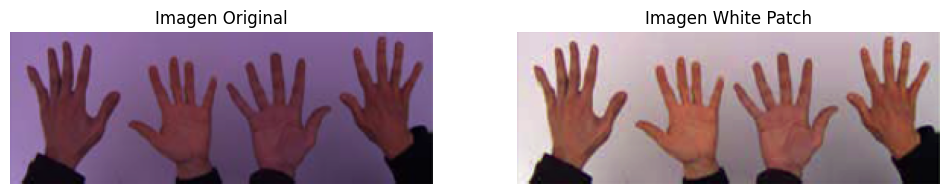

Valor max del canal Rojo: 210
Valor max del canal Verde: 250
Valor max del canal Azul: 171


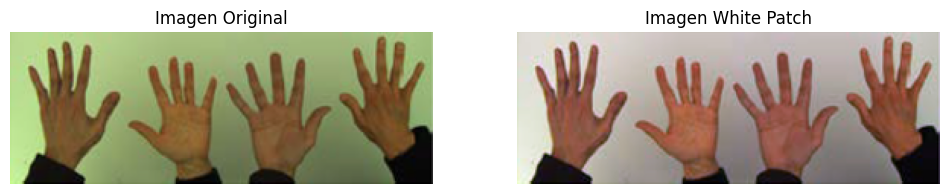

Valor max del canal Rojo: 247
Valor max del canal Verde: 157
Valor max del canal Azul: 175


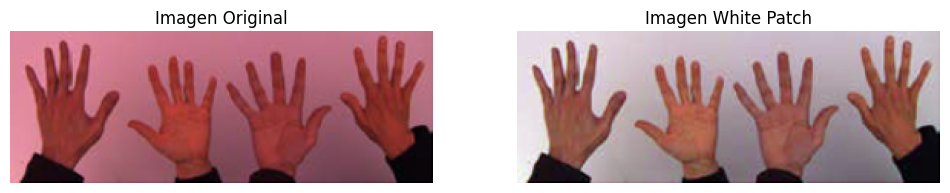

In [9]:
white_patch('white_patch/test_blue.png') 
white_patch('white_patch/test_green.png')  
white_patch('white_patch/test_red.png')   

Valor max del canal Rojo: 255
Valor max del canal Verde: 255
Valor max del canal Azul: 255


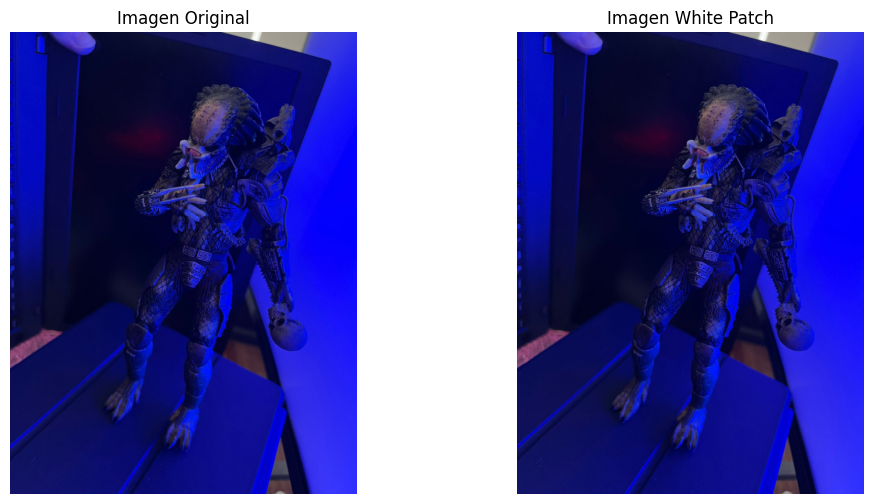

In [10]:
white_patch('white_patch/wp_blue.jpg') 

La imagen de salida es igual a la de entrada porque el valor máximo de los 3 canales es 255 y los coeficientes quedan iguales a 1.

Valor max del canal Rojo: 126
Valor max del canal Verde: 252
Valor max del canal Azul: 155


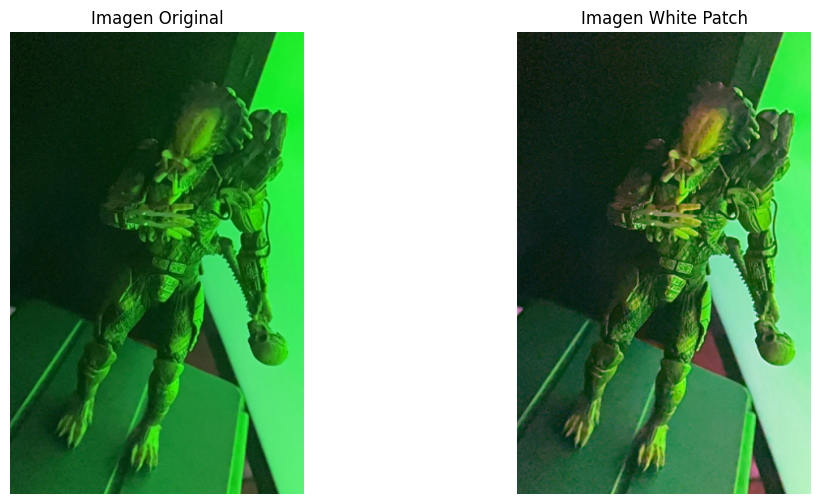

Valor max del canal Rojo: 170
Valor max del canal Verde: 255
Valor max del canal Azul: 172


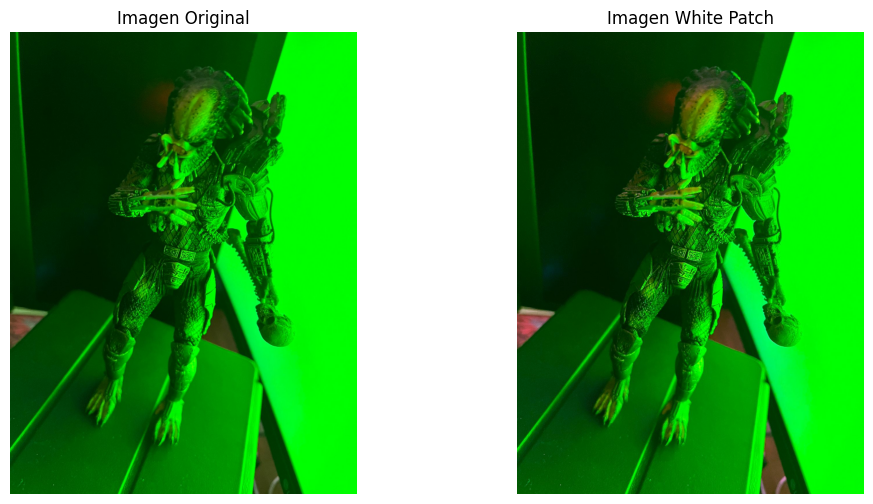

In [11]:
white_patch('white_patch/wp_green.png') 
white_patch('white_patch/wp_green2.jpg') 


En ambas imágenes vemos que el canal principal es el verde, pero tenemos diferentes resultados al aplicar el algoritmo.

En la primera imagen el valor máximo del canal verde es 252, lo que implica que el coeficiente es mayor a 1 y se está modificando este canal. 

En la segunda imagen no vemos un cambio al aplicar el algoritmo porque el valor máximo del canal verde es 255 y por ende no se modifica este canal.

Valor max del canal Rojo: 255
Valor max del canal Verde: 134
Valor max del canal Azul: 122


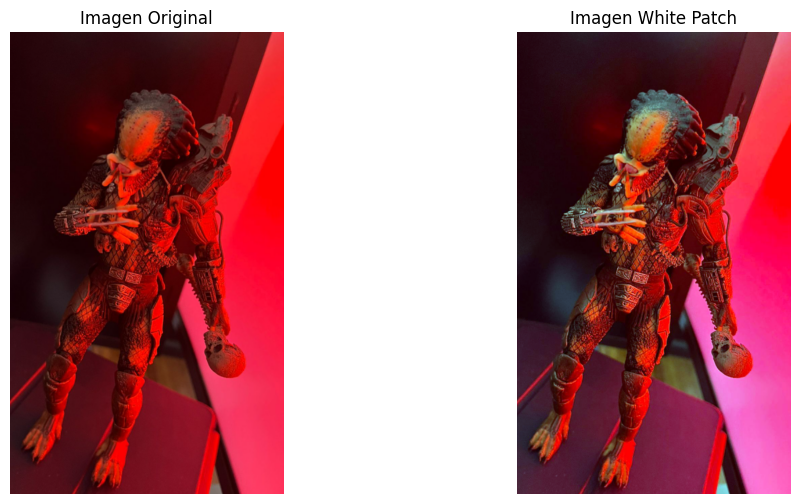

Valor max del canal Rojo: 255
Valor max del canal Verde: 201
Valor max del canal Azul: 203


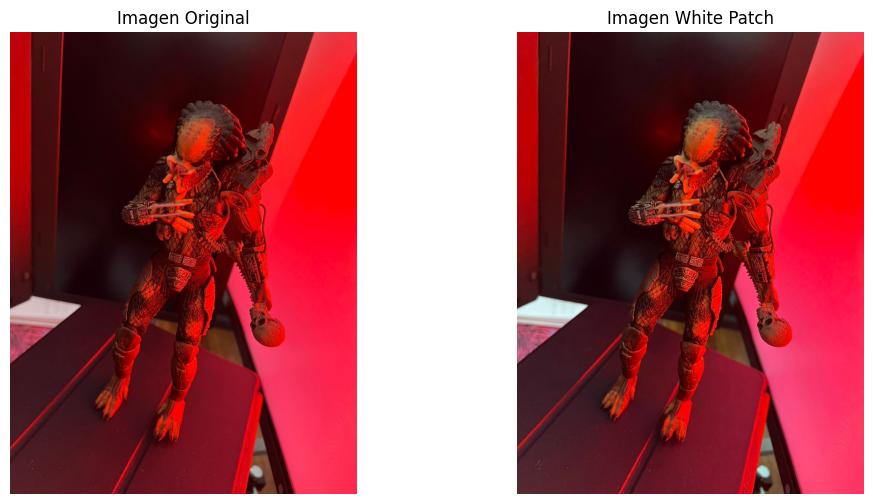

In [12]:
white_patch('white_patch/wp_red.png') 
white_patch('white_patch/wp_red2.jpg') 

En la primera imagen funciona mejor white patch porque aunque el valor max del canal rojo sea 255, los canales restantes tienen un valor máximo menor, lo que implica un coeficiente mayor a 1. 

En la segunda imagen no funciona bien white patch porque los tres canales estan cercanos al valor máximo, y por ende los coeficientes de corrección son más chicos.

* Función que toma un determinado percentil:

In [13]:
def white_patch_perc(image_path,percentil):  

    # Cargamos la imagen  
    image = cv.imread(image_path)  
    
    # Convertimos de BGR a RGB  
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)  

    # Separamos los canales
    im_r, im_g, im_b = cv.split(image_rgb)

    scale_r = 255 / np.percentile(im_r.flatten(), percentil)
    scale_g = 255 / np.percentile(im_g.flatten(), percentil)
    scale_b = 255 / np.percentile(im_b.flatten(), percentil)

    im_r_c = np.clip(im_r * scale_r,0,255).astype(np.uint8)  
    im_g_c = np.clip(im_g * scale_g,0,255).astype(np.uint8)  
    im_b_c = np.clip(im_b * scale_b,0,255).astype(np.uint8)  


    # Recombinamos los canales  
    wp_image = cv.merge((im_r_c, im_g_c, im_b_c))  

    # Visualizamos las imágenes  
    plt.figure(figsize=(12, 6))  
    plt.subplot(1, 2, 1)  
    plt.title('Imagen Original')  
    plt.imshow(image_rgb)  
    plt.axis('off')  

    plt.subplot(1, 2, 2)  
    plt.title('Imagen White Patch')  
    plt.imshow(wp_image)  
    plt.axis('off')  

    plt.show()
 

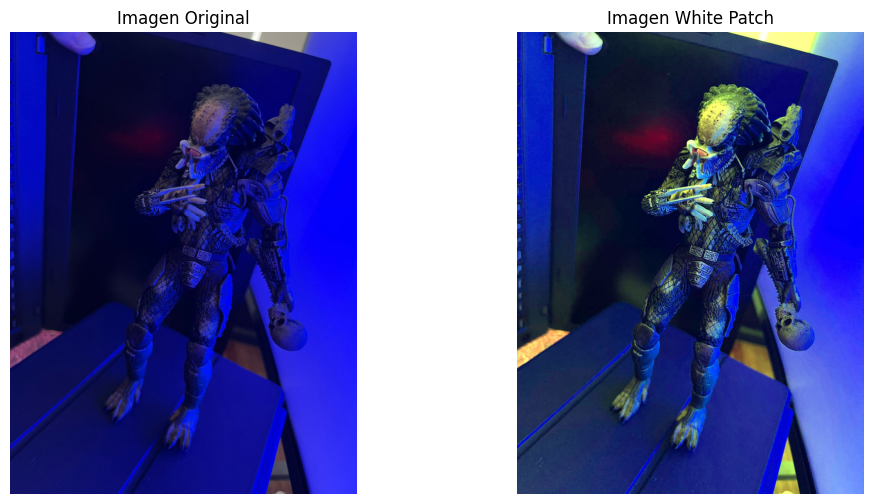

In [14]:
white_patch_perc('white_patch/wp_blue.jpg',99) 

Vemos que calculando el factor de corrección con un percentil en vez del valor máximo cuando el valor máximo de los canales es 255, tenemos una mejor imagen de salida.

3. Función optimizada con percentil:

In [15]:
def white_patch_transform(image_path, percentile=95):

    # Cargamos la imagen  
    image = cv.imread(image_path)  
    # Convertimos de BGR a RGB  
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)  

    use_percentile = False
    rgb_max = np.max(image_rgb, axis=(0,1))
    if np.any(rgb_max == 255):
        rgb_max = np.percentile(image_rgb, percentile, axis=(0,1))
        use_percentile = True
    result_image = (255.0/rgb_max) * image_rgb
    return np.clip(result_image,0,255).astype(np.uint8), use_percentile

In [16]:
# generamos un barra interactiva para variar el percentil y ver los resultados
def show_wp_image(percentile):

    image, use_percentile = white_patch_transform('white_patch/wp_blue.jpg', percentile=percentile)
    plt.imshow(image)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

threshold_slider = widgets.IntSlider(value=90, min=1, max=100, step=1, description='Percentile') 
   
widgets.interact(show_wp_image, percentile=threshold_slider)    

interactive(children=(IntSlider(value=90, description='Percentile', min=1), Output()), _dom_classes=('widget-i…

<function __main__.show_wp_image(percentile)>

### PARTE 2

Leeemos con OpenCV en escala de grises las imagenes y las visualizamos

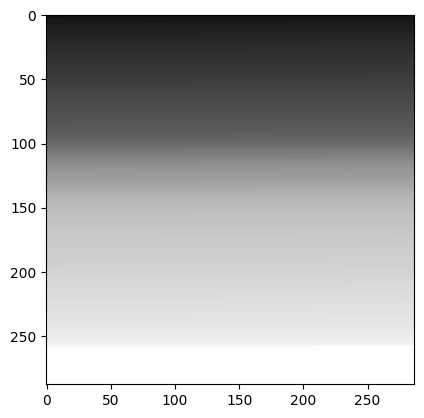

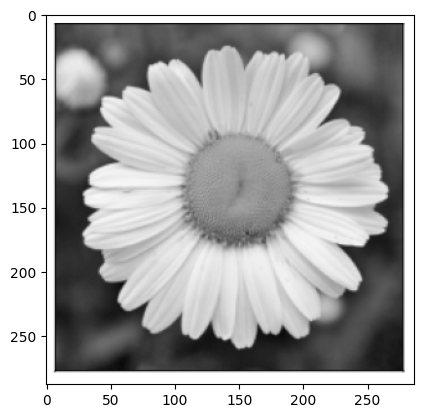

In [17]:
image_grey = cv.imread('img1_tp.png', cv.IMREAD_GRAYSCALE)
plt.imshow(image_grey, cmap='gray')
plt.show()
image_grey = cv.imread('img2_tp.png', cv.IMREAD_GRAYSCALE)
plt.imshow(image_grey, cmap='gray')
plt.show()

Calculamos los histogramas con diferentes bins.

<Figure size 640x480 with 0 Axes>

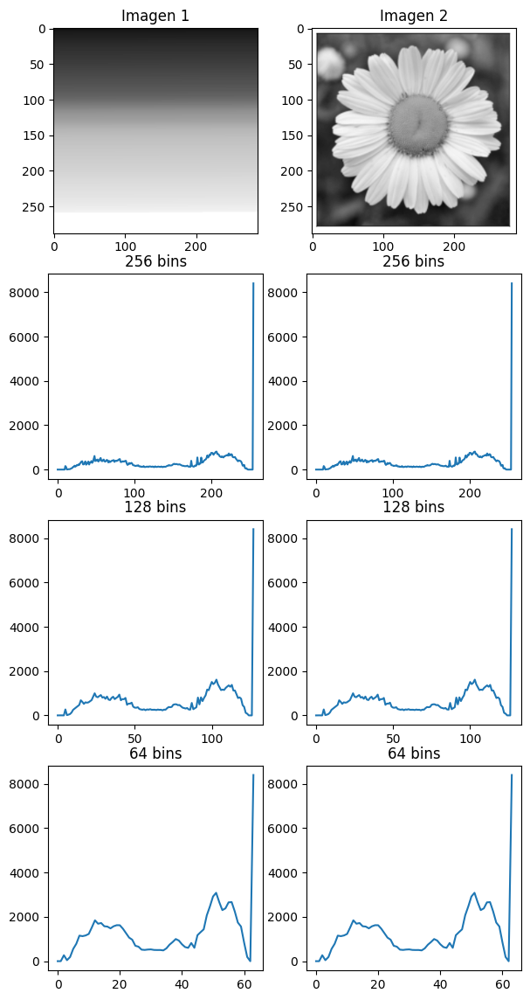

In [18]:
img1 = cv.imread('img1_tp.png', cv.IMREAD_GRAYSCALE) 
img2 = cv.imread('img2_tp.png', cv.IMREAD_GRAYSCALE) 

fig = plt.figure()
plt.figure(figsize=(7,14))
# Imagen 1
ax1=plt.subplot(421)
ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title('Imagen 1')

hist1,bins1 = np.histogram(img1.ravel(),256,[0,256])
ax2=plt.subplot(423)
ax2.plot(hist1)
ax2.set_title('256 bins')

hist1,bins1 = np.histogram(img1.ravel(),128,[0,256])
ax3=plt.subplot(425)
ax3.plot(hist1)
ax3.set_title('128 bins')

hist1,bins1 = np.histogram(img1.ravel(),64,[0,256])
ax4=plt.subplot(427)
ax4.plot(hist1)
ax4.set_title('64 bins')

# Imagen 2
ax5=plt.subplot(422)
ax5.imshow(img2, cmap='gray', vmin=0, vmax=255)
ax5.set_title('Imagen 2')

hist2,bins2 = np.histogram(img2.ravel(),256,[0,256])
ax6=plt.subplot(424)
ax6.plot(hist2)
ax6.set_title('256 bins')

hist2,bins2 = np.histogram(img2.ravel(),128,[0,256])
ax7=plt.subplot(426)
ax7.plot(hist2)
ax7.set_title('128 bins')

hist2,bins2 = np.histogram(img2.ravel(),64,[0,256])
ax8=plt.subplot(428)
ax8.plot(hist2)
ax8.set_title('64 bins')

plt.show()


In [19]:
# Ordenamos los valores de los pixeles de la imagen de la margarita de menor a mayor, observamos que la distribución de pixeles resultante es identica a la imagen 1: 

image_1_flat = img1.flatten()
image_2_flat = img2.flatten()
# image_2 = image_2.sort()
image_2_flat_sort = np.sort(image_2_flat)
print("Image 1 " + str(img1.shape))
print("Image 2 " + str(img2.shape))
if np.array_equal(image_1_flat,image_2_flat_sort):
    print("There are equal")
else:
    print("There are some difference")

Image 1 (288, 287)
Image 2 (288, 287)
There are equal


Conclusión:

Observamos que los histogramas son indénticos por lo que no vemos de utilidad incorporar este dato como una feature para un modelo de clasificación. Ya que dos imágenes completamente distintas presentan el mismo histograma.

### SEGMENTACION

Visualizamos la imagen a segmentar en RGB.

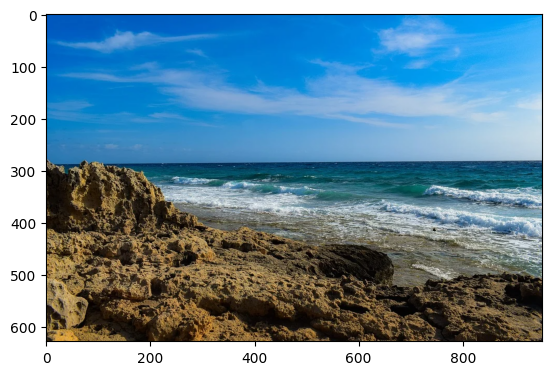

In [20]:
segm_original = cv.imread('segmentacion.png')      
segm = cv.cvtColor(segm_original, cv.COLOR_BGR2RGB)  
plt.imshow(segm) 

Graficamos el histograma conjunto de los canales RGB.

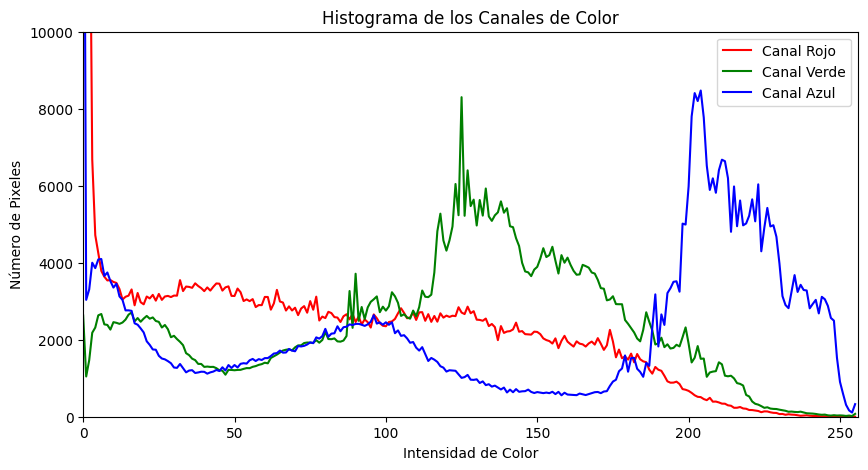

In [21]:
im_r, im_g, im_b = cv.split(segm)

hist_r,binsr = np.histogram(im_r,256,[0,256])
hist_g,binsg = np.histogram(im_g,256,[0,256])
hist_b,binsb = np.histogram(im_b,256,[0,256])

# Graficamos los histogramas  
plt.figure(figsize=(10, 5))  
plt.plot(hist_r, color='red', label='Canal Rojo')  
plt.plot(hist_g, color='green', label='Canal Verde')  
plt.plot(hist_b, color='blue', label='Canal Azul')  
plt.title('Histograma de los Canales de Color')  
plt.xlabel('Intensidad de Color')  
plt.ylabel('Número de Pixeles')  
plt.legend()  
plt.xlim([0, 256])  
plt.ylim([0, 10000])  
plt.show()

En el canal rojo: vemos que los pixeles se concentran en valores de intensidad más bajos (0).

En el canal verde:  vemos que la distribución de píxeles tiene un pico en los valores medios.

En el canal azul: vemos que hay un pico en los valores más pequeños y luego hay otro pico en los valores de mayor intensidad.

Pasamos la imagen a HSV, analizamos los histogramas de los tres canales.

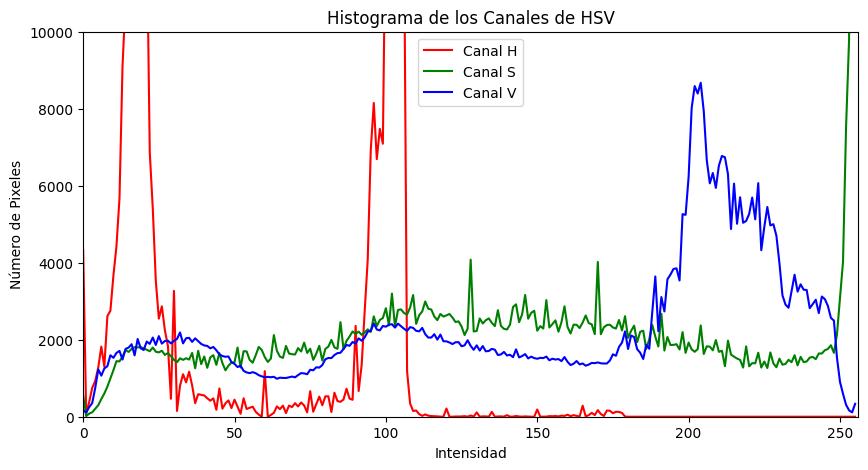

In [22]:
segm_HSV = cv.cvtColor(segm, cv.COLOR_RGB2HSV)
im_h, im_s, im_v = cv.split(segm_HSV)

hist_h,binsh = np.histogram(im_h,256,[0,256])
hist_s,binss = np.histogram(im_s,256,[0,256])
hist_v,binsv = np.histogram(im_v,256,[0,256])

# Graficamos los histogramas  
plt.figure(figsize=(10, 5))  
plt.plot(hist_h, color='red', label='Canal H')  
plt.plot(hist_s, color='green', label='Canal S')  
plt.plot(hist_v, color='blue', label='Canal V')  
plt.title('Histograma de los Canales de HSV')  
plt.xlabel('Intensidad')  
plt.ylabel('Número de Pixeles')  
plt.legend()  
plt.xlim([0, 256])  
plt.ylim([0, 10000])  
plt.show()

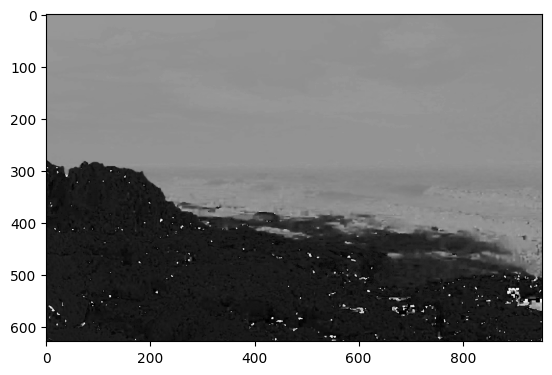

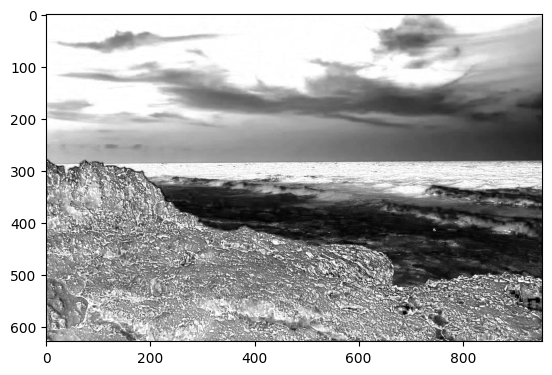

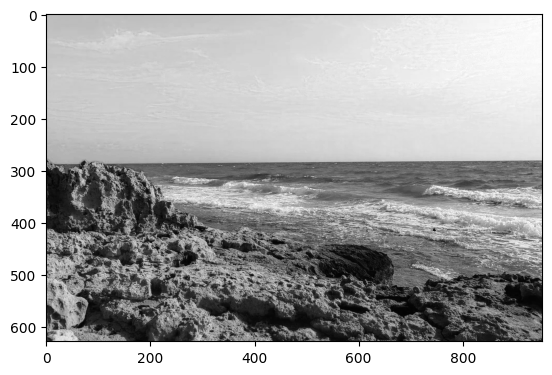

In [23]:
# vemos en escala de grises los tres canales de HSV
im_h, im_s, im_v = cv.split(segm_HSV)
plt.figure()

plt.imshow(im_h, cmap='gray')
plt.show()
plt.figure()

plt.imshow(im_s,cmap='gray')
plt.show()
plt.figure()

plt.imshow(im_v,cmap='gray')
plt.show()

Calculamos los perfiles de intensidad de cada canal de la columna 450

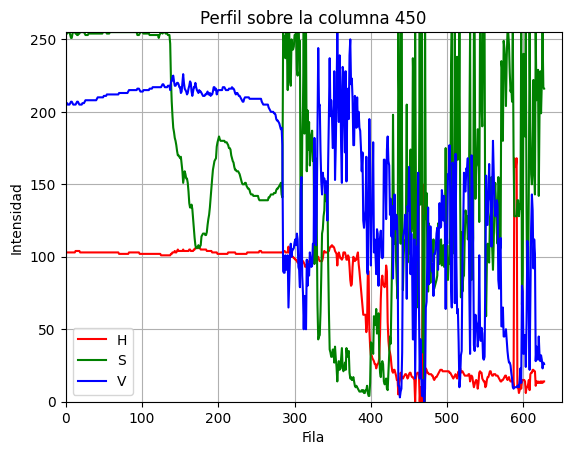

In [24]:
# Graficar los perfiles de intensidad de cada canal
plt.figure()
idx_col = 450
perfil_color = segm_HSV[:, idx_col]
plt.plot(perfil_color[:,0], color='r',label='H')
plt.plot(perfil_color[:,1], color='g',label='S')
plt.plot(perfil_color[:,2], color='b',label='V')
plt.xlabel('Fila')
plt.ylabel('Intensidad')
plt.title('Perfil sobre la columna {}'.format(idx_col))
plt.grid()
plt.xlim(0,650)
plt.ylim(0,255)
plt.legend()
plt.show()

#### SEGMENTACION POR MUESTRAS

SEGMENTAMOS LA ARENA

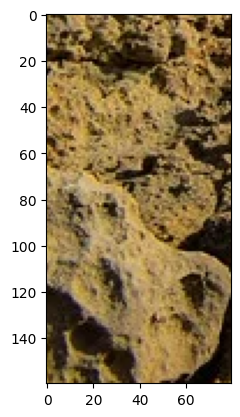

In [25]:
# Tomamos una muestra de la arena
arena = segm[440:600, 0:80,:]
plt.figure(2)
plt.imshow(arena)
plt.show()

[128.722578125, 103.995703125, 61.04109375]
[56.95897637974431, 51.362176595836196, 37.481274892320705]


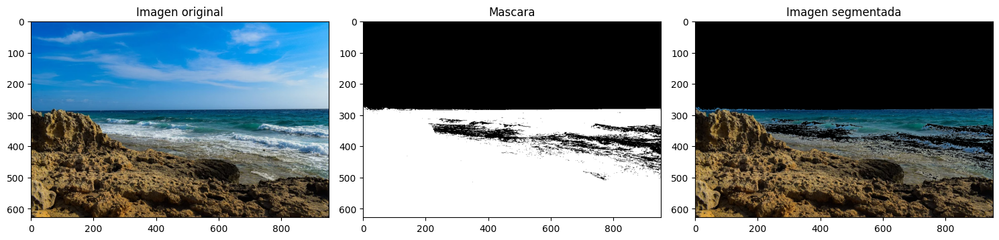

In [26]:
color_mean, color_std = cv.meanStdDev(arena)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

n_sigma = 3
mask = cv.inRange(segm, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(segm, segm, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(segm)
plt.title('Imagen original')

plt.subplot(1, 3, 2)
plt.imshow(mask,cmap='gray')
plt.title('Mascara')

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada)
plt.title('Imagen segmentada')

# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()

Aca notamos que si bien la arena se segmenta bien, tambien está trayendo bastante del mar que no deberia. Para esto vamos a probar lo mismo pero en HSV

[19.6915625, 147.514296875, 128.72953125]
[15.06901386317611, 48.06946095858952, 56.944528680596434]


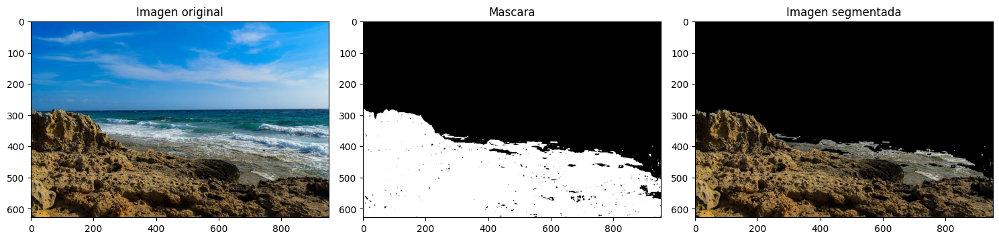

In [27]:
color_mean, color_std = cv.meanStdDev(segm_HSV[440:600, 0:80,:])
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

n_sigma = 3
mask = cv.inRange(segm_HSV, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(segm, segm, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(segm)
plt.title('Imagen original')

plt.subplot(1, 3, 2)
plt.imshow(mask,cmap='gray')
plt.title('Mascara')

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada)
plt.title('Imagen segmentada')

# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()

Haciendo la segmentación por la imagen en HSV vemos un mejor resultado en la segmentación.

SEGMENTAMOS EL CIELO

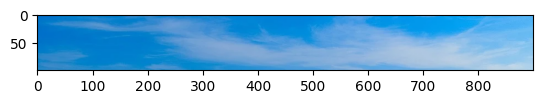

In [28]:
# Tomamos una muestra del cielo
cielo = segm[100:200, 0:900,:]
plt.figure(2)
plt.imshow(cielo)
plt.show()

[69.74067777777778, 156.16677777777778, 218.04076666666668]
[57.593290183903235, 24.648747695382404, 13.132966757616703]


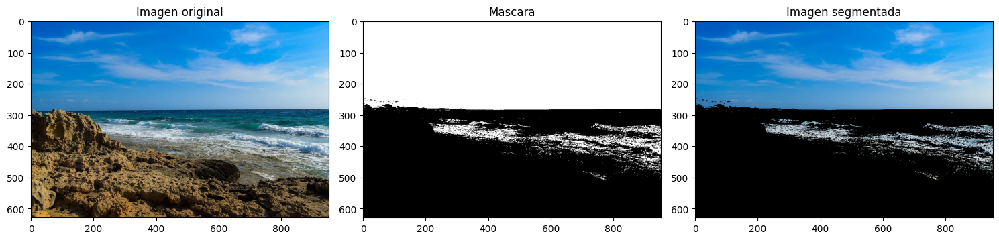

In [29]:
color_mean, color_std = cv.meanStdDev(cielo)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

n_sigma = 3
mask = cv.inRange(segm, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(segm, segm, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(segm)
plt.title('Imagen original')

plt.subplot(1, 3, 2)
plt.imshow(mask,cmap='gray')
plt.title('Mascara')

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada)
plt.title('Imagen segmentada')

# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()

[102.98674444444445, 175.1389888888889, 218.04076666666668]
[1.636341400543882, 64.96128097977451, 13.132966757616703]


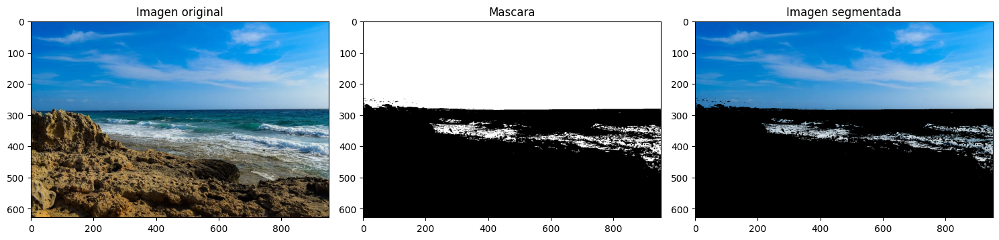

In [30]:
color_mean, color_std = cv.meanStdDev(segm_HSV[100:200, 0:900,:])
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

n_sigma = 3
mask = cv.inRange(segm_HSV, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(segm, segm, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(segm)
plt.title('Imagen original')

plt.subplot(1, 3, 2)
plt.imshow(mask,cmap='gray')
plt.title('Mascara')

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada)
plt.title('Imagen segmentada')

# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()

Tomando una muestra de la imagen en RGB y HSV vemos que obtenemos una segmentación parecida.

SEGMENTAMOS EL MAR

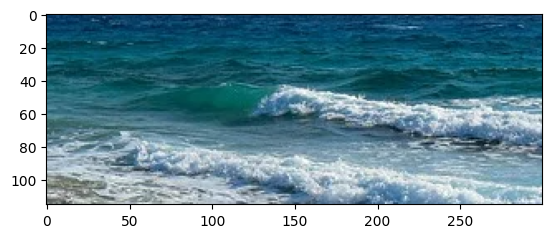

In [31]:
# Tomamos una muestra del mar
mar = segm[285:400, 600:900,:]
plt.figure(2)
plt.imshow(mar)
plt.show()

[75.24643478260869, 120.96310144927536, 138.0188115942029]
[69.51299342860418, 50.87957878213693, 47.06873136394134]


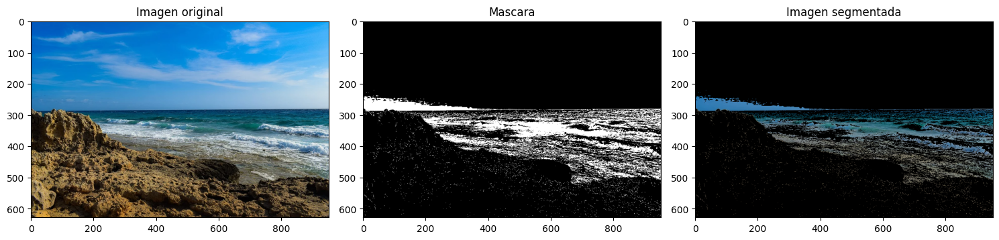

In [32]:
color_mean, color_std = cv.meanStdDev(mar)
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

n_sigma = 1
mask = cv.inRange(segm, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(segm, segm, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(segm)
plt.title('Imagen original')

plt.subplot(1, 3, 2)
plt.imshow(mask,cmap='gray')
plt.title('Mascara')

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada)
plt.title('Imagen segmentada')

# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()

[96.92892592592592, 189.29596296296296, 114.04859259259258]
[3.3296902806241215, 63.67404842603926, 33.81845991988013]


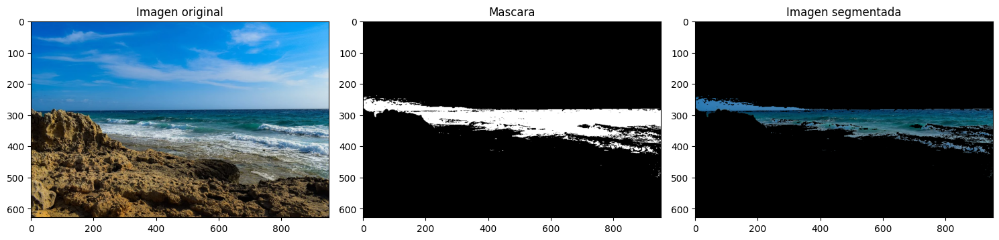

In [33]:
color_mean, color_std = cv.meanStdDev(segm_HSV[290:350, 350:800,:])
print(color_mean.flatten().tolist())
print(color_std.flatten().tolist())

n_sigma = 2
mask = cv.inRange(segm_HSV, color_mean-color_std * n_sigma,  color_mean+color_std * n_sigma)
img_segmentada = cv.bitwise_and(segm, segm, mask=mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(segm)
plt.title('Imagen original')

plt.subplot(1, 3, 2)
plt.imshow(mask,cmap='gray')
plt.title('Mascara')

plt.subplot(1, 3, 3)
plt.imshow(img_segmentada)
plt.title('Imagen segmentada')

# Ajustar el diseño y mostrar
plt.tight_layout()
plt.show()

Conclusión:

Si bien logramos segmentar bien la arena, no logramos hacerlo tan bien para el cielo y mar dado que tienen una gama colores muy similares y tampoco vemos una diferencia significativa a nivel saturación.

#### OTRA OPCION: SEGMENTACION UTILIZANDO LOS HISTOGRAMAS

SEGMENTACION DEL CIELO

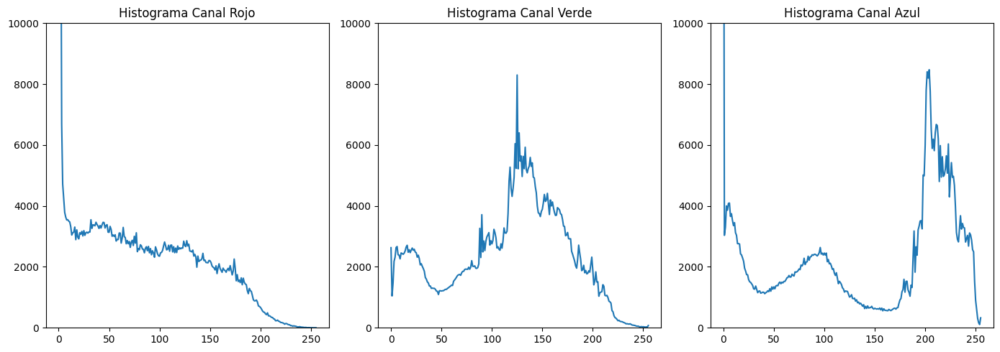

In [34]:
# Analizamos los histogramas de los canales RGB, y elegimos el canal azul para definir un threshold a utilizar en la segmentación.
fig, axs = plt.subplots(1, 3, figsize=(14,5))

axs[0].set_title('Histograma Canal Rojo')
axs[1].set_title('Histograma Canal Verde')
axs[2].set_title('Histograma Canal Azul')
for index in range(segm.shape[2]):
    hist, bins = np.histogram(segm[:,:,index].ravel(), 256, (0, 256), density=False)
    axs[index].set_ylim(0, 10000)
    axs[index].plot(hist)

plt.tight_layout()
plt.show()

(np.float64(-0.5), np.float64(952.5), np.float64(627.5), np.float64(-0.5))

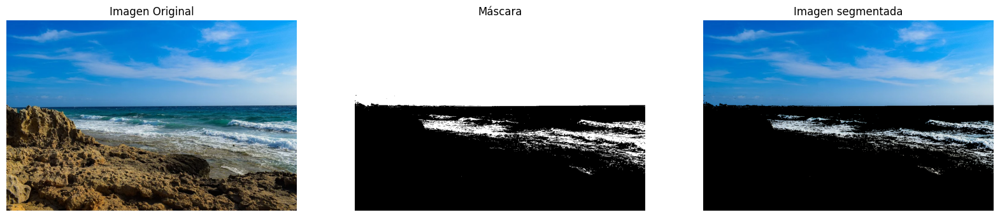

In [35]:
#Dado que el color principal del cielo es el azul. Elegimos de ese canal los valores de mayor frecuencia
ret, seg_image_bin = cv.threshold(segm[:,:,2], 175 , 255, cv.THRESH_BINARY)

figure = plt.figure(figsize=(20,15))

plt.subplot(131).set_title('Imagen Original')
plt.subplot(131).imshow(segm)
plt.subplot(131).axis('off')

plt.subplot(132).set_title('Máscara')
plt.subplot(132).imshow(seg_image_bin, cmap='gray')
plt.subplot(132).axis('off')

plt.subplot(133).set_title('Imagen segmentada')
segmented_img = cv.bitwise_and(segm, segm, mask=seg_image_bin)
plt.subplot(133).imshow(segmented_img)
plt.subplot(133).axis('off')

SEGMENTACION DE LA ARENA

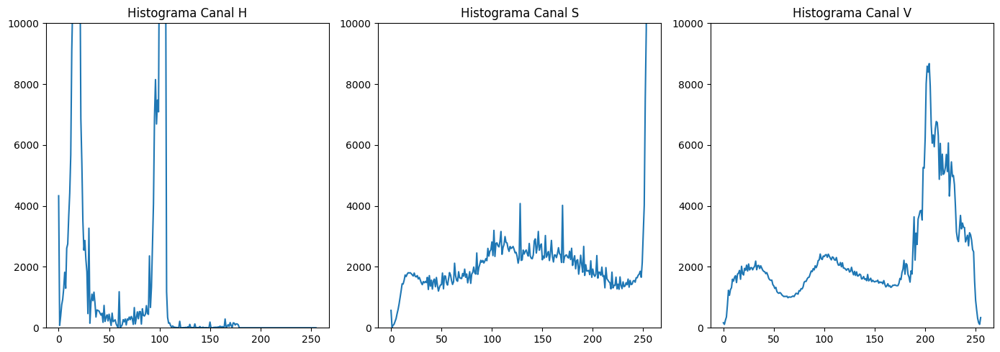

In [36]:
# Analizamos los histogramas de los canales HSV, y elegimos el canal H para definir un threshold a utilizar en la segmentación.

fig, axs = plt.subplots(1, 3, figsize=(14,5))
segm_HSV = cv.cvtColor(segm, cv.COLOR_RGB2HSV)


axs[0].set_title('Histograma Canal H')
axs[1].set_title('Histograma Canal S')
axs[2].set_title('Histograma Canal V')
for index in range(segm_HSV.shape[2]):
    hist, bins = np.histogram(segm_HSV[:,:,index].ravel(), 256, (0, 256), density=False)
    axs[index].set_ylim(0, 10000)
    axs[index].plot(hist)

plt.tight_layout()
plt.show()

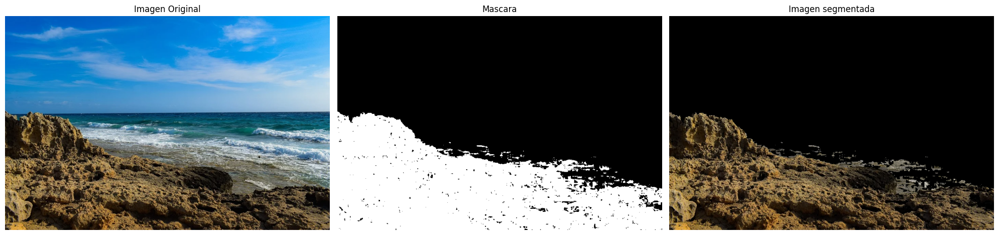

In [37]:
#Elegimos un threshold entre 0 y 25 para tomar los colores marrones de la arena.

ret, seg_image_bin = cv.threshold(segm_HSV[:,:,0], 25 , 255, cv.THRESH_BINARY_INV)

figure = plt.figure(figsize=(20,15))

plt.subplot(131).set_title('Imagen Original')
plt.subplot(131).imshow(segm)
plt.subplot(131).axis('off')

plt.subplot(132).set_title('Mascara')
plt.subplot(132).imshow(seg_image_bin, cmap='gray')
plt.subplot(132).axis('off')

segmented_img = cv.bitwise_and(segm, segm, mask=seg_image_bin)

plt.subplot(133).set_title('Imagen segmentada')
plt.subplot(133).imshow(segmented_img)
plt.subplot(133).axis('off')

plt.tight_layout()
plt.show()

SEGMENTACION DEL MAR

(np.float64(-0.5), np.float64(952.5), np.float64(627.5), np.float64(-0.5))

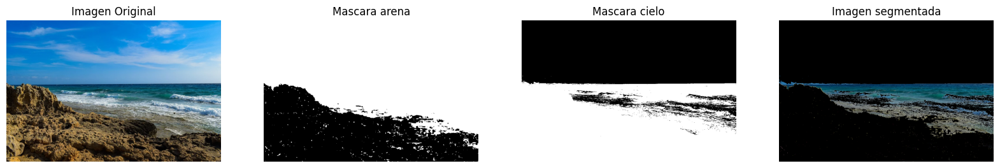

In [38]:
# Para segmentar el mar, sumamos las mascaras de arena y cielo y luego las restamos con la imagen para obtener el mar.
ret, hsv_seg_image_bin = cv.threshold(segm_HSV[:,:,0], 25 , 255, cv.THRESH_BINARY)
ret, seg_image_bin = cv.threshold(segm[:,:,2], 175 , 255, cv.THRESH_BINARY_INV)

figure = plt.figure(figsize=(20,15))

plt.subplot(141).set_title('Imagen Original')
plt.subplot(141).imshow(segm)
plt.subplot(141).axis('off')

plt.subplot(142).set_title('Mascara arena')
plt.subplot(142).imshow(hsv_seg_image_bin, cmap='gray')
plt.subplot(142).axis('off')

plt.subplot(143).set_title('Mascara cielo')
plt.subplot(143).imshow(seg_image_bin, cmap='gray')
plt.subplot(143).axis('off')

img_mask = cv.bitwise_and(hsv_seg_image_bin, seg_image_bin)
plt.subplot(144).set_title('Imagen segmentada')
plt.subplot(144).imshow(segmented_img, cmap='gray')
plt.subplot(144).axis('off')

segmented_img = cv.bitwise_and(segm, segm, mask=img_mask)
plt.subplot(144).imshow(segmented_img, cmap='gray')
plt.subplot(144).axis('off')